# **Tugas Besar Mata Kuliah Pembelajaran Mesin**
**Muhammad Hafidh Raditya**

**1301184079**

**IF-42-03**

Import library yang diperlukan

In [2]:
import random as rd
import pandas as pd
from pandas.plotting import scatter_matrix
import numpy as np
import matplotlib.pyplot as plt 
import seaborn as sns
import missingno as msno
import warnings
from matplotlib import style
from sklearn import datasets, linear_model
from sklearn.model_selection import train_test_split
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, MinMaxScaler
warnings.filterwarnings('ignore')

In [5]:
from google.colab import files
files.upload()

Saving salju_train.csv to salju_train.csv


{'salju_train.csv': b'id,Tanggal,KodeLokasi,SuhuMin,SuhuMax,Hujan,Penguapan,SinarMatahari,ArahAnginTerkencang,KecepatanAnginTerkencang,ArahAngin9am,ArahAngin3pm,KecepatanAngin9am,KecepatanAngin3pm,Kelembaban9am,Kelembaban3pm,Tekanan9am,Tekanan3pm,Awan9am,Awan3pm,Suhu9am,Suhu3pm,BersaljuHariIni,BersaljuBesok\r\n1,01/06/2014,C4,10.4,15.5,4.8,,,WSW,24,,WSW,0,13,78,76,1020.1,1018.5,,,13.1,15,Ya,Tidak\r\n2,15/07/2014,C10,9,17,8,2.6,7.4,,,SW,WNW,13,20,80,61,1015.2,1014.6,7,5,11.9,15.5,Ya,Ya\r\n3,16/02/2011,C46,18.2,32,0,,,ESE,44,SE,SE,15,26,62,42,,,,,23.8,29.6,Tidak,Tidak\r\n4,08/08/2012,C36,7.3,24.5,0,8.4,10.4,SSW,54,N,SW,13,19,25,17,1019.2,1016.9,1,7,15.3,23.2,Tidak,Tidak\r\n5,29/10/2016,C7,5.9,20.3,0,3.6,12.6,N,37,NNW,ESE,22,19,55,48,1019.7,1014.7,2,6,12.4,18.1,Tidak,Tidak\r\n6,12/06/2011,C12,14.4,21.8,0,3.2,4.4,SW,39,SW,SSW,19,20,63,52,1016.1,1012.5,7,7,16.7,21.1,Tidak,Tidak\r\n7,13/06/2009,C36,7.7,18.7,0.2,5.6,9.7,WNW,46,NW,WNW,19,28,69,31,1011.3,1008.8,1,1,11.3,18.3,Tidak,Tidak\r\n8,07

In [6]:
dataset = pd.read_csv("salju_train.csv")
dataset.head()
dataset.shape

(109095, 24)

In [7]:
dataset.describe()

,id,SuhuMin,SuhuMax,Hujan,Penguapan,SinarMatahari,KecepatanAnginTerkencang,KecepatanAngin9am,KecepatanAngin3pm,Kelembaban9am,Kelembaban3pm,Tekanan9am,Tekanan3pm,Awan9am,Awan3pm,Suhu9am,Suhu3pm
count,109095.000000,107973.000000,108166.000000,106664.000000,62071.000000,56716.000000,101399.000000,107742.000000,106792.000000,107093.000000,105721.000000,97768.000000,97787.000000,67251.000000,64624.000000,107755.000000,106397.000000
mean,54548.000000,12.196183,23.214819,2.385005,5.462440,7.599527,40.032002,14.052115,18.677579,68.895577,51.567626,1017.647080,1015.253117,4.450893,4.516140,16.991391,21.672771
std,31493.158146,6.389419,7.106596,8.588155,4.201638,3.789042,13.617554,8.926092,8.830199,18.995528,20.791573,7.117338,7.047875,2.884566,2.718738,6.477602,6.922833
min,1.000000,-8.500000,-4.800000,0.000000,0.000000,0.000000,7.000000,0.000000,0.000000,0.000000,0.000000,980.500000,977.100000,0.000000,0.000000,-7.200000,-5.400000
25%,27274.500000,7.600000,17.900000,0.000000,2.600000,4.800000,31.000000,7.000000,13.000000,57.000000,37.000000,1012.900000,1010.400000,1.000000,2.000000,12.300000,16.600000
50%,54548.000000,12.000000,22.600000,0.000000,4.800000,8.400000,39.000000,13.000000,19.000000,70.000000,52.000000,1017.600000,1015.200000,5.000000,5.000000,16.700000,21.100000
75%,81821.500000,16.800000,28.200000,0.800000,7.400000,10.600000,48.000000,19.000000,24.000000,83.000000,66.000000,1022.400000,1020.000000,7.000000,7.000000,21.600000,26.400000
max,109095.000000,33.900000,47.300000,371.000000,145.000000,14.300000,135.000000,130.000000,87.000000,100.000000,100.000000,1041.000000,1039.600000,9.000000,9.000000,40.200000,46.700000


# **DATA PRE-PROCESSING**
Hapus record yang memiliki missing values

In [8]:
dataset.dropna(inplace=True)
dataset.shape

(42411, 24)

In [9]:
dataset.isnull().sum().sum()

0

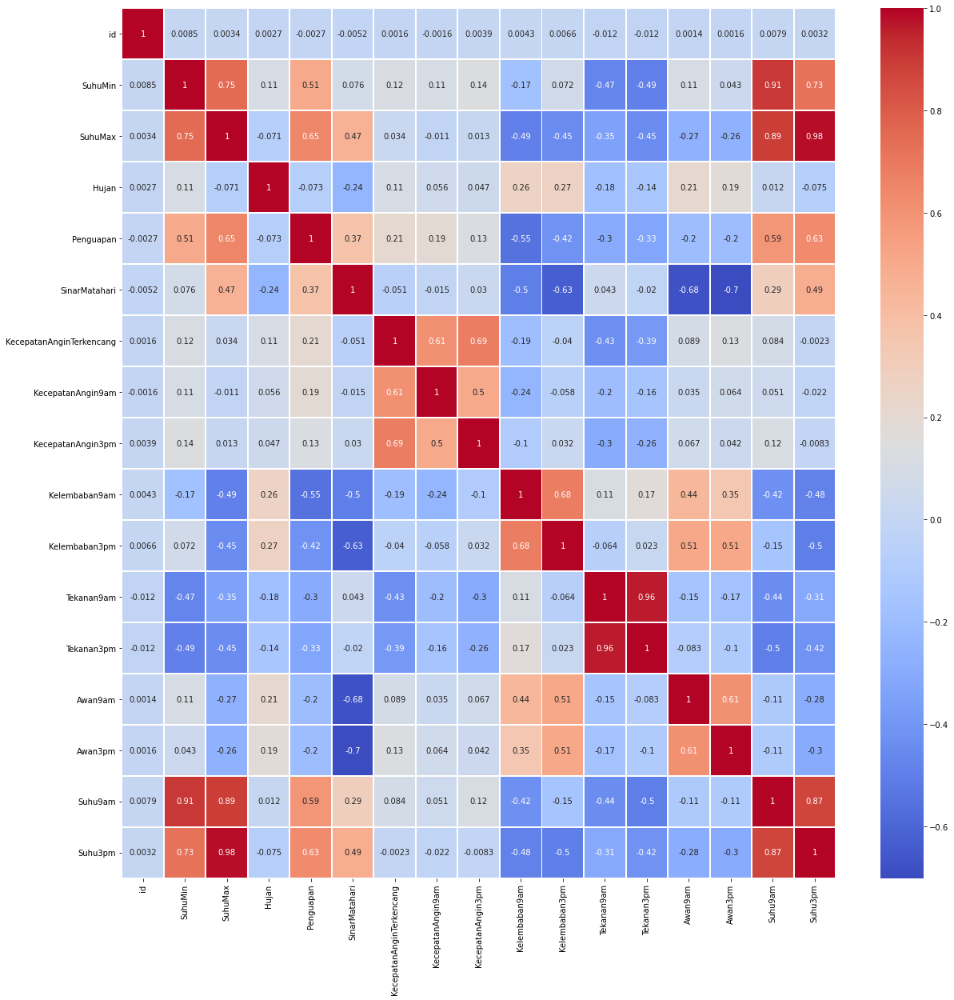

In [10]:
plt.figure(figsize=(20,20))
sns.heatmap(dataset.corr(),
            cmap='coolwarm',
            annot=True,linewidths=1);